# Machine Learning LAB 2: SUPPORT VECTOR MACHINES
Course 2022/23: P. Zanuttigh, M. Mel, F. Barbato

The notebook contains some simple tasks to be performed with **SUPPORT VECTOR MACHINES (SVM)**. <br>
Complete all the **required code sections** and **answer to all the questions**. <br>

### IMPORTANT for the evaluation score:
1. **Read carefully all cells** and **follow the instructions**
2. **Re-run all the code from the beginning** to obtain the results for the final version of your notebook, since this is the way we will do it before evaluating your notebooks.
3. Make sure to fill the code in the appropriate places **without modifying the template**, otherwise you risk breaking later cells.
4. Please **submit the jupyter notebook file (.ipynb)**, do not submit python scripts (.py) or plain text files. **Make sure that it runs fine with the restat&run all command**.
5. **Answer the questions in the appropriate cells**, not in the ones where the question is presented.

<div class="alert alert-block alert-warning">
I will use yellow boxes to highlight personal comments (i.e. markdown cells that I have written in between the code cells) to better differentiate between "template" markdown cells and my own markdown cells. 
</div>

# Weather Classification with Support Vector Machines

In this notebook we are going to explore the use of Support Vector Machines (SVM) for weather classification. We will use a dataset collected using the Luxottica iSee glasses, similarly to the previous laboratory.
The dataset corresponds to 8 hours of atmospherical data recordings sampled every 3 seconds.

The dataset labels are the following:

| ID | Label |
| :-: | :-: |
| 0 | Sunny |
| 1 | Rain |
| 2 | Cloudy |
| 3 | Mostly Clear|

Place your **name** and **ID number** (matricola) in the cell below. <br>
Also recall to **save the file as Surname_Name_LAB2.ipynb**, failure to do so will incur in a **lower grade**.
<br>

**Student name**: Nicolò Lai<br>
**ID Number**: 2090566

In [2]:
#load the required packages
%matplotlib inline

import numpy as np
import scipy as sp
from matplotlib import pyplot as plt

import sklearn
from sklearn.datasets import fetch_openml
from sklearn.neural_network import MLPClassifier
from sklearn.decomposition import PCA
import sklearn.metrics as skm

#import SVC
from sklearn.svm import SVC
#import for Cross-Validation
from sklearn.model_selection import GridSearchCV
import plotly.graph_objects as go



In [3]:
# helper function to load the dataset
def load_dataset(path):
    with np.load(path) as data:
        x, y = data["x"], data["y"]
        
        # normalize data
        x -= x.mean(axis=0)
        x /= x.std(axis=0)
        
    return x, y

In [4]:
#function for plotting a image and printing the corresponding label
def plot_input(X_matrix, labels):
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(projection="3d")
    cmap = plt.cm.get_cmap('Accent', 4)
    im = ax.scatter(X_matrix[:,0], X_matrix[:,1], X_matrix[:,2], c=labels, cmap=cmap)
    im.set_clim(-0.5, 3.5)
    cbar=fig.colorbar(im, ticks=[0,1,2,3], orientation='vertical', cmap=cmap, shrink=0.5)
    cbar.ax.set_yticklabels(['Sunny', 'Rainy','Cloudy', 'Mostly clear']) 
    plt.show()
    

In [5]:
def plot_interactive(X, y, clf, opacity=0.01, labels=("Sunny", "Rainy", "Cloudy", "Mostly clear"), colors=("#7fc97f","#fdc086", "#f0027f", "#666666"), granularity=25, title="Decision regions visualization"):
    """Function for interactive visualization of decision regions of a classifier."""
    
    x_max = np.abs(X).max()
    x_range = np.linspace(-x_max, x_max, granularity)
    x_grid = np.stack(np.meshgrid(x_range, x_range, x_range)).reshape(3, -1).T

    pred_grid = clf.predict(x_grid)
    pred_x    = clf.predict(X)

    fig = go.Figure()

    misclassified = np.where(pred_x != y)[0]

    fig.add_trace(go.Scatter3d(visible=True, x=x_grid[:, 0], y=x_grid[:, 1], z=x_grid[:, 2], mode='markers', marker=dict(size=4, color=pred_grid, colorscale=colors, opacity=opacity), name="Prediction regions"))
        
    fig.add_trace(go.Scatter3d(visible=True, x=X[:, 0], y=X[:, 1], z=X[:, 2], mode='markers', marker=dict(size=5, color=y, colorscale=colors), name="Dataset"))
        
    fig.add_trace(go.Scatter3d(visible="legendonly", x=X[misclassified, 0], y=X[misclassified, 1], z=X[misclassified, 2], mode='markers', marker=dict(size=5, color=pred_x[misclassified], colorscale=colors, line=dict(color='turquoise', width=2)), name="Misclassified points"))


    fig.update_layout(width=800, height=600, title=title, title_x=0.5, title_y=0.9, title_font_size=20)
    fig.update_layout(legend=dict(font=dict(size=16)))
    fig.update_layout(scene=dict(xaxis=dict(range=[-x_max, x_max]), yaxis=dict(range=[-x_max, x_max]), zaxis=dict(range=[-x_max, x_max])))

    fig.show()

In [6]:
def comparison_barplot(fig, errors_1, errors_2, title, xlabel="Kernel", ylabel="Error", labels=("Training", "Test"), names=("Linear", "Poly2", "Poly3", "RBF"), width=0.25, ax_id=111, ax=None):
    if ax is None:
        ax=fig.add_subplot(ax_id)
    
    ax.grid(axis='y', alpha=0.5)
    ax.set_axisbelow(True)
    
    x = np.arange(len(names))
    ax.bar(x - width/2, errors_1, width, label=labels[0], color='lightblue',  edgecolor='black',)
    ax.bar(x + width/2, errors_2, width, label=labels[1], color='lightgreen', edgecolor='black',)
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)
    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(names)
    ax.legend(fontsize=12)
    
    for i, err_1, err_2 in zip(x, errors_1, errors_2):
        ax.text(i - width/2, err_1+0.001, f"{err_1:.3f}", ha='center', va='bottom')
        ax.text(i + width/2, err_2+0.001, f"{err_2:.3f}", ha='center', va='bottom')
    
    ax.set_ylim(0, max(max(errors_1), max(errors_2)) + 0.01)
        
    return ax
    

## A) Hyper-parameter search

**TO DO (A.0):** **Set** the random **seed** using your **ID**. If you need to change it for testing add a constant explicitly, eg.: 1234567 + 1

In [7]:
# fix your ID ("numero di matricola") and the seed for random generator
# as usual you can try different seeds by adding a constant to the number:
# ID = 1234567 + X
ID = 2090566 + 1
np.random.seed(ID)

Before proceding to the training steps, we **load the dataset and split it** in training and test set (while the **training** set is **typically larger**, here we set the number of training samples to 1000 and 4000 for the test data).
The **split** is **performed after applying a random permutation** to the dataset, such permutation will **depend on the seed** you set above.<br><br>
**DO NOT CHANGE THE PRE-WRITTEN CODE UNLESS OTHERWISE SPECIFIED**

In [8]:
X, y = load_dataset("data/lux.npz")
print(X.shape, y.shape)

(15099, 3) (15099,)


In [9]:
# The task is quite easy, let's add noise to make it more challenging!
# You can try without noise (comment the next 2 lines, easy task), with the suggested amount of noise,
# or play with the suggested amount of noise 

noise = np.random.normal(0, 0.1, X.shape)
X=X+noise

**TO DO (A.1):** **Divide** the **data into training and test set** (for this part use 1000 samples in the **first** set, 4000 in the **second** one). Make sure that each label is present at least 10 times in training. If it is not, then keep adding permutations to the initial data until this happens. <br>


In [10]:
# random permute the data and split into training and test taking the first 1000
# data samples as training and 4000 samples as test
permutation = np.random.permutation(X.shape[0]) 

X =  X[permutation]
y =  y[permutation]

m_training = 1000
m_test     = 4000

X_train = X[:m_training]
X_test  = X[m_training:m_training+m_test]
y_train = y[:m_training]
y_test  = y[m_training:m_training+m_test]

print("X_train shape:", X_train.shape,"X_test shape:", X_test.shape,"||","y_train shape:",  y_train.shape,"y_test shape:", y_test.shape)

labels, freqs = np.unique(y_train, return_counts=True)
print("Labels in training dataset: ", labels)
print("Frequencies in training dataset: ", freqs)

# show the first 10 rows of the training dataset with the corresponding labels
print()
for i in range(10):
    print(f"X_train[{i}] = {X_train[i]}\t y_train[{i}] = {y_train[i]}")

X_train shape: (1000, 3) X_test shape: (4000, 3) || y_train shape: (1000,) y_test shape: (4000,)
Labels in training dataset:  [0. 1. 2. 3.]
Frequencies in training dataset:  [411 175 363  51]

X_train[0] = [-0.78018439 -0.59426508  0.58779452]	 y_train[0] = 0.0
X_train[1] = [ 1.02679841  0.61103018 -1.35770712]	 y_train[1] = 2.0
X_train[2] = [ 1.25398892 -1.37096652  1.09800855]	 y_train[2] = 1.0
X_train[3] = [ 1.34265908 -0.32744864 -0.88868941]	 y_train[3] = 1.0
X_train[4] = [-1.32019655  1.83522186  0.13052121]	 y_train[4] = 0.0
X_train[5] = [-0.7099588  -0.68038919  0.36468322]	 y_train[5] = 0.0
X_train[6] = [ 0.1460409   0.09519344 -0.94534147]	 y_train[6] = 3.0
X_train[7] = [ 2.17758552 -0.09127475 -1.32636148]	 y_train[7] = 2.0
X_train[8] = [-0.20673588 -0.98307135  1.49067537]	 y_train[8] = 2.0
X_train[9] = [-0.11662432 -0.86988017  1.44269328]	 y_train[9] = 2.0


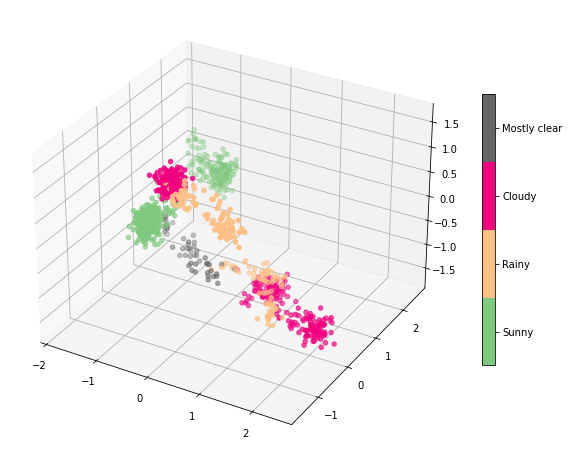

In [11]:
#let's try the plotting function
plot_input(X_train,y_train)

**TO DO (A.2):** Use a SVM classfier with cross validation to pick a model. Use a 4-fold cross-validation. Let's start with a Linear kernel.

In [12]:
# parameters for linear SVM
parameters = {'C': [ 0.01, 0.1, 1, 10]}

#train linear SVM
clf_lin = GridSearchCV(SVC(kernel='linear'), parameters, cv=4)
clf_lin.fit(X_train, y_train)

print ('RESULTS FOR LINEAR KERNEL')

print("Best parameters set found:")
print(clf_lin.best_params_)

print("Score with best parameters:")
print(clf_lin.best_score_)

print("\nAll scores on the grid:")
# print the core for each configuration specifying the configuration
print(clf_lin.cv_results_['mean_test_score'])

RESULTS FOR LINEAR KERNEL
Best parameters set found:
{'C': 10}
Score with best parameters:
0.893

All scores on the grid:
[0.773 0.875 0.891 0.893]


<div class="alert alert-block alert-warning">
    Since, by default, the <tt>GridSearchCV</tt> function has the <tt>refit</tt> parameter set to <tt>True</tt>, the best estimator is automatically refit on the whole training set. This means that we don't need to fit the model again after the grid search. Through the <tt>best_estimator_</tt> attribute we can access the best estimator found by the grid search that has been refit on the whole training set. Therefore, we can use the <tt>best_estimator_</tt>to score and predict the training and test set.<br>

In the following cells (usually after the grid search) I will use the <tt>best_estimator_</tt> to score and predict the training set to compute the number of misclassified samples (i.e. training error) and the accuracy on the training set. Later, after all the kernels have been explored, I will carry out the same operations on the test set to compute the test error and the accuracy on the test set. <br>

Finally, a few plots comparing the training and test error between the different kernels will be shown. Comments on the results will be provided at the end of this exploration in the notebook questions.
</div>

In [13]:
number_misc = np.sum(y_train != clf_lin.best_estimator_.predict(X_train))
print(f"Number of misclassified samples: {number_misc} out of {m_training} ({number_misc/m_training*100:.2f}%)")
print(f"Accuracy on training set: {clf_lin.best_estimator_.score(X_train, y_train):.4f}")

Number of misclassified samples: 104 out of 1000 (10.40%)
Accuracy on training set: 0.8960


<div class="alert alert-block alert-warning">
    I have prepared the <tt>plot_interactive()</tt> function to show the the dataset (either train or test), the decision boundaries learned by the classifier and eventually the misclassified samples. <br>

Misclassified samples have their borders highlighted in turquoise, while their facecolor is the one representing the wrongly predicted class.
By default, the misclassified samples are hidden. To enable them, simply click on the "Misclassified samples" button inside the legend on the right. <br>

<del>I have placed a slider on the bottom that changes the opacity of the decision boundaries. By default is set to be very small to better see the data and eventually the misclassified samples. To better visualize the decision boundaries simply move the slider to the right.</del> <br>

I have remove the opacity slider otherwise the notebook would have been too heavy to upload! Now the opacity of the decision boundaries is given as a parameter to the <tt>plot_interactive()</tt> function. To visualize decision boundaries it is suggested an opacity of 0.3 or greater!

</div>

In [14]:
plot_interactive(X_test, y_test, clf_lin.best_estimator_, opacity=0.01, title="Linear SVM decision regions visualization")

**TO DO (A.3):** Pick a model for the Polynomial kernel with degree=2.

In [15]:
# parameters for poly with degree 2 kernel
parameters = {'C': [0.01, 0.1, 1],'gamma':[0.01, 0.1, 1.]}

#run SVM with poly of degree 2 kernel

clf_poly2 = GridSearchCV(SVC(kernel='poly', degree=2), parameters, cv=4)
clf_poly2.fit(X_train, y_train)

print ('RESULTS FOR POLY DEGREE=2 KERNEL')

print("Best parameters set found:")
print(clf_poly2.best_params_)

print("Score with best parameters:")
print(clf_poly2.best_score_)

print("\nAll scores on the grid:")
print(clf_poly2.cv_results_['mean_test_score'])
print()

for i, config in enumerate(clf_poly2.cv_results_['params']):
    print(f"{config} score={clf_poly2.cv_results_['mean_test_score'][i]:.3f}")

RESULTS FOR POLY DEGREE=2 KERNEL
Best parameters set found:
{'C': 1, 'gamma': 1.0}
Score with best parameters:
0.946

All scores on the grid:
[0.411 0.411 0.847 0.411 0.772 0.932 0.411 0.847 0.946]

{'C': 0.01, 'gamma': 0.01} score=0.411
{'C': 0.01, 'gamma': 0.1} score=0.411
{'C': 0.01, 'gamma': 1.0} score=0.847
{'C': 0.1, 'gamma': 0.01} score=0.411
{'C': 0.1, 'gamma': 0.1} score=0.772
{'C': 0.1, 'gamma': 1.0} score=0.932
{'C': 1, 'gamma': 0.01} score=0.411
{'C': 1, 'gamma': 0.1} score=0.847
{'C': 1, 'gamma': 1.0} score=0.946


In [16]:
number_misc = np.sum(y_train != clf_poly2.best_estimator_.predict(X_train))
print(f"Number of misclassified samples: {number_misc} out of {m_training} ({number_misc/m_training*100:.2f}%)")
print(f"Accuracy on training set: {clf_poly2.best_estimator_.score(X_train, y_train):.4f}")

Number of misclassified samples: 47 out of 1000 (4.70%)
Accuracy on training set: 0.9530


In [17]:
plot_interactive(X_test, y_test, clf_poly2.best_estimator_, opacity=0.01, title="Poly degree 2 SVM decision regions visualization")

**TO DO (A.4):** Now let's try a higher degree for the polynomial kernel (e.g., 3rd degree).

In [18]:
# parameters for poly with higher degree kernel
parameters = {'C': [0.01, 0.1, 1],'gamma':[0.01,0.1, 1]}

#run SVM with poly of higher degree kernel
degree = 3

clf_poly3 = GridSearchCV(SVC(kernel='poly', degree=degree), parameters, cv=4)
clf_poly3.fit(X_train, y_train)

print ('RESULTS FOR POLY DEGREE=', degree, ' KERNEL')

print("Best parameters set found:")
print(clf_poly3.best_params_)

print("Score with best parameters:")
print(clf_poly3.best_score_)

print("\nAll scores on the grid:")
print(clf_poly3.cv_results_['mean_test_score'])
print()

for i, config in enumerate(clf_poly3.cv_results_['params']):
    print(f"{config} score={clf_poly3.cv_results_['mean_test_score'][i]:.3f}")

RESULTS FOR POLY DEGREE= 3  KERNEL
Best parameters set found:
{'C': 1, 'gamma': 1}
Score with best parameters:
0.934

All scores on the grid:
[0.411 0.411 0.862 0.411 0.507 0.904 0.411 0.763 0.934]

{'C': 0.01, 'gamma': 0.01} score=0.411
{'C': 0.01, 'gamma': 0.1} score=0.411
{'C': 0.01, 'gamma': 1} score=0.862
{'C': 0.1, 'gamma': 0.01} score=0.411
{'C': 0.1, 'gamma': 0.1} score=0.507
{'C': 0.1, 'gamma': 1} score=0.904
{'C': 1, 'gamma': 0.01} score=0.411
{'C': 1, 'gamma': 0.1} score=0.763
{'C': 1, 'gamma': 1} score=0.934


In [19]:
number_misc = np.sum(y_train != clf_poly3.best_estimator_.predict(X_train))
print(f"Number of misclassified samples: {number_misc} out of {m_training} ({number_misc/m_training*100:.2f}%)")
print(f"Accuracy on training set: {clf_poly3.best_estimator_.score(X_train, y_train):.4f}")

Number of misclassified samples: 63 out of 1000 (6.30%)
Accuracy on training set: 0.9370


In [20]:
plot_interactive(X_test, y_test, clf_poly3.best_estimator_, opacity=0.01, title="Poly degree 3 SVM decision regions visualization")

**TO DO (A.5):** Pick a model for the Radial Basis Function kernel:

In [21]:
# parameters for rbf SVM
parameters = {'C': [0.1, 1, 10, 100],'gamma':[0.001, 0.01, 0.1, 1]}

#run SVM with rbf kernel

clf_rbf = GridSearchCV(SVC(kernel='rbf'), parameters, cv=4)
clf_rbf.fit(X_train, y_train)

print ('RESULTS FOR rbf KERNEL')

print("Best parameters set found:")
print(clf_rbf.best_params_)

print("Score with best parameters:")
print(clf_rbf.best_score_)

print("\nAll scores on the grid:")
print(clf_rbf.cv_results_['mean_test_score'])
print()

for i, config in enumerate(clf_rbf.cv_results_['params']):
    print(f"{config} score={clf_rbf.cv_results_['mean_test_score'][i]:.3f}")

RESULTS FOR rbf KERNEL
Best parameters set found:
{'C': 10, 'gamma': 1}
Score with best parameters:
0.989

All scores on the grid:
[0.411 0.592 0.84  0.957 0.59  0.783 0.949 0.985 0.773 0.886 0.984 0.989
 0.881 0.973 0.987 0.984]

{'C': 0.1, 'gamma': 0.001} score=0.411
{'C': 0.1, 'gamma': 0.01} score=0.592
{'C': 0.1, 'gamma': 0.1} score=0.840
{'C': 0.1, 'gamma': 1} score=0.957
{'C': 1, 'gamma': 0.001} score=0.590
{'C': 1, 'gamma': 0.01} score=0.783
{'C': 1, 'gamma': 0.1} score=0.949
{'C': 1, 'gamma': 1} score=0.985
{'C': 10, 'gamma': 0.001} score=0.773
{'C': 10, 'gamma': 0.01} score=0.886
{'C': 10, 'gamma': 0.1} score=0.984
{'C': 10, 'gamma': 1} score=0.989
{'C': 100, 'gamma': 0.001} score=0.881
{'C': 100, 'gamma': 0.01} score=0.973
{'C': 100, 'gamma': 0.1} score=0.987
{'C': 100, 'gamma': 1} score=0.984


In [22]:
number_misc = np.sum(y_train != clf_rbf.best_estimator_.predict(X_train))
print(f"Number of misclassified samples: {number_misc} out of {m_training} ({number_misc/m_training*100:.2f}%)")
print(f"Accuracy on training set: {clf_rbf.best_estimator_.score(X_train, y_train):.4f}")

Number of misclassified samples: 12 out of 1000 (1.20%)
Accuracy on training set: 0.9880


In [23]:
plot_interactive(X_test, y_test, clf_rbf.best_estimator_, opacity=0.01, title="RBF SVM decision regions visualization")

<div class="alert alert-block alert-warning">
In the next cell I show a barplot comparing the training and test error for the different kernels. The training error is computed using the <tt>best_estimator_</tt> on the training set. The test error is computed using the <tt>best_estimator_</tt> on the test set. <br>

Blue bars represent the training error, while green bars represent the test error. <br>
</div>

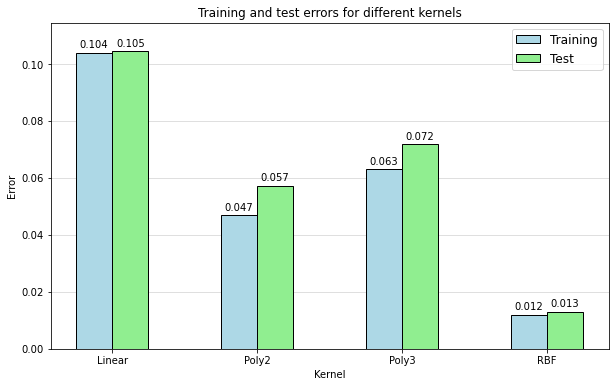

In [24]:
# get the best model for every kernel
best_lin   = clf_lin.best_estimator_
best_poly2 = clf_poly2.best_estimator_
best_poly3 = clf_poly3.best_estimator_
best_rbf   = clf_rbf.best_estimator_

kernels = [best_lin, best_poly2, best_poly3, best_rbf]

# training error
training_errors = [1-best.score(X_train, y_train) for best in kernels]
test_errors     = [1-best.score(X_test, y_test) for best in kernels]

# kernel names
kernel_names = ['Linear', 'Poly2', 'Poly3', 'RBF']

fig = plt.figure(figsize=(10, 6))
ax = comparison_barplot(fig, training_errors, test_errors, "Training and test errors for different kernels", names=kernel_names)

plt.show()

**TO DO (A.Q1) [Answer the following]** <br> 
What do you observe when using RBF and polynomial kernels on this dataset ?

<div class="alert alert-block alert-info">
<strong>ANSWER A.Q1</strong>:<br>

Overall, it is quite clear the the RBF kernel performs bettern than any polynomial kernel that I have tested (degree 1, 2, an 3). <br>

Quantitatively, the RBF kernel has a much lower error rate (equally, much higher accuracy) than the polynomial kernels. In terms of error rate, the RBF kernel approximately miscallifies 1% of the samples for both the training and test set. On the other hand, polynomial kernels misclassify between 5% and 10% of the samples. <br>

Since the RBF kernel is behaving quite accurately, we can be confident that the model is neither overfitting nor underfitting the training set. Polynomial kernels are not overfitting the training set (the error difference between training and test set is not that significant even for poly 2 and poly 3). Instead, polynomial kernels are probably underfitting the data. <br>

The first hint that the polynomial kernels are underfitting the training set is that both training error and test error are quite large. We can get a deeper insight by looking at the decision boundaries (interactive plots, decision boundary opacity reasonably high). The linear kernel is clearly the worst, as its decision boundaries are very simple and do not capture the complexity of the data. The poly 2 and poly 3 kernel slightly increase the quality of the decision boundaries by enabling them to be curved and not just straight lines. However, the decision boundaries are still not complex enough to capture the complexity of the data. Of course, our data is not linearly separable, but on top of that it seems to be arranged in "blobs" and there are multiple disjoint blobs of data belonging to the same class! The RBF kernel is the only one that is able to capture the complexity of the data and the decision boundaries are able to separate the data in the different blobs. 
</div>

**TO DO (A.6):** Report here the best SVM kernel and parameters

In [25]:
# get training and test error for the best SVM model from CV

best_SVM = kernels[np.argmin(test_errors)]
# print(best_SVM)
print(f"Best kernel: {kernel_names[np.argmin(test_errors)]} with parameters: C={best_SVM.get_params()['C']} and gamma={best_SVM.get_params()['gamma']}")
print()

# (error is 1 - svm.score)
training_error = 1 - best_SVM.score(X_train, y_train)
test_error     = 1 - best_SVM.score(X_test,  y_test)
print ("Best SVM training error: %f" % training_error)
print ("Best SVM test error: %f"     % test_error)

Best kernel: RBF with parameters: C=10 and gamma=1

Best SVM training error: 0.012000
Best SVM test error: 0.013000


**TO DO (A.7):** Analyze how the gamma parameter (inversely proportional to standard deviation of Gaussian Kernel) impact the performances of the classifier

[1.e-05 1.e-04 1.e-03 1.e-02 1.e-01 1.e+00 1.e+01 1.e+02]


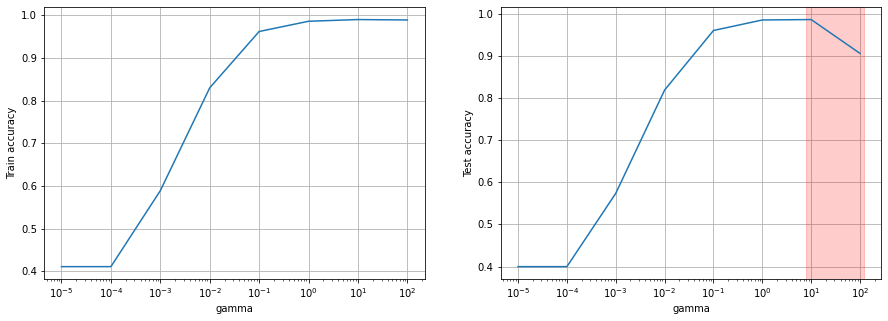

In [26]:
#Test with different values of gamma

gamma_values = np.logspace(-5,2,8)
print(gamma_values)

# use rbf kernel and C=1
train_acc_list, test_acc_list = [], []

for gamma in gamma_values:
    clf_gamma = SVC(kernel='rbf', C=1, gamma=gamma)
    clf_gamma.fit(X_train, y_train)
    train_acc_list.append(clf_gamma.score(X_train, y_train))
    test_acc_list.append(clf_gamma.score(X_test, y_test))


# Plot
fig, ax = plt.subplots(1,2, figsize=(15,5))

ax[0].plot(gamma_values, train_acc_list)
ax[0].set_xscale('log')
ax[0].set_xlabel('gamma')
ax[0].set_ylabel('Train accuracy')
ax[0].grid(True)
ax[0].set_axisbelow(True)

ax[1].plot(gamma_values, test_acc_list)
ax[1].set_xscale('log')
ax[1].set_xlabel('gamma')
ax[1].set_ylabel('Test accuracy')
ax[1].grid(True)
ax[1].set_axisbelow(True)

# high gamma values that potentially manifeset overfitting
ax[1].axvspan(8, 120, alpha=0.2, color='red')

plt.show()

<div class="alert alert-block alert-warning">
We see that the gamma parameter has a significant impact on the performance of the classifier. <br>

Precisely, gamma values that are too small (e.g., 0.0001) lead to a very low accuracy both on the training set and test set. This is due to the fact that the decision boundaries are too smooth and do not capture the complexity of the data. Increasing gamma increases the complexity of the decision boundaries and the accuracy on the training and test set increases. At some point, though, increasing gamma too much leads to overfitting the training set, namely the training set accuracy keeps rising but the test set accuracy drops (the region that I have highlighted in red!). This happens because the decision boundaries are too complex and they start to capture the noise in the data. <br>
</div>

## B) More data
Now let's do the same but using more data points for training.

**TO DO (B.0):** Choose a higher number of data points (e.g. x = 10000) for training data depending on your computing capability.

In [27]:
X = X[permutation]
y = y[permutation]

m_training = 10000
m_test     = 4000

X_train, X_test = X[:m_training], X[m_training:m_training+m_test]
y_train, y_test = y[:m_training], y[m_training:m_training+m_test]

print(f"Training set size: {X_train.shape[0]}")
print(f"Test set size: {X_test.shape[0]}")
print()

labels, freqs = np.unique(y_train, return_counts=True)
print("Labels in training dataset: ", labels)
print("Frequencies in training dataset: ", freqs)

labels, freqs = np.unique(y_test, return_counts=True)
print("Labels in test dataset: ", labels)
print("Frequencies in test dataset: ", freqs)

# initialize support variables for boundaries visualization
granularity = 25
x_max = np.abs(X).max()
x_range = np.linspace(-x_max, x_max, granularity)
x_grid = np.stack(np.meshgrid(x_range, x_range, x_range)).reshape(3, -1).T

Training set size: 10000
Test set size: 4000

Labels in training dataset:  [0. 1. 2. 3.]
Frequencies in training dataset:  [4063 1651 3668  618]
Labels in test dataset:  [0. 1. 2. 3.]
Frequencies in test dataset:  [1621  687 1450  242]


**TO DO (B.1):** Let's try to use SVM with parameters obtained from the best model for $m_{training} =  10000$. Since it may take a long time to run, you can decide to just let it run for some time and stop it if it does not complete. If you decide to do this, report it in the TO DO (C.Q1) cell below.

In [28]:
#get training and test error for the best SVM model from CV

best_SVM = SVC(kernel='rbf', C=10, gamma=1)
print(best_SVM)

best_SVM.fit(X_train, y_train)

# fraction of miscalssified points
training_error = 1 - best_SVM.score(X_train, y_train)
test_error     = 1 - best_SVM.score(X_test, y_test)

print ("Best SVM training error: %f" % training_error)
print ("Best SVM test error: %f" % test_error)

SVC(C=10, gamma=1)
Best SVM training error: 0.010800
Best SVM test error: 0.009750


In [29]:
clf_lin_1 = clf_lin.best_estimator_
clf_lin_1.fit(X_train, y_train)

training_error = 1 - clf_lin_1.score(X_train, y_train)
test_error     = 1 - clf_lin_1.score(X_test, y_test)

print(f"Best linear SVM training error: {training_error:.5f}")
print(f"Best linear SVM test error: {test_error:.5f}")
print()

clf_poly2_1 = clf_poly2.best_estimator_
clf_poly2_1.fit(X_train, y_train)

training_error = 1 - clf_poly2_1.score(X_train, y_train)
test_error     = 1 - clf_poly2_1.score(X_test, y_test)

print(f"Best poly2 SVM training error: {training_error:.5f}")
print(f"Best poly2 SVM test error: {test_error:.5f}")
print()

clf_poly3_1 = clf_poly3.best_estimator_
clf_poly3_1.fit(X_train, y_train)

training_error = 1 - clf_poly3_1.score(X_train, y_train)
test_error     = 1 - clf_poly3_1.score(X_test, y_test)

print(f"Best poly3 SVM training error: {training_error:.5f}")
print(f"Best poly3 SVM test error: {test_error:.5f}")
print()

clf_rbf_1 = clf_rbf.best_estimator_
clf_rbf_1.fit(X_train, y_train)

training_error = 1 - clf_rbf_1.score(X_train, y_train)
test_error     = 1 - clf_rbf_1.score(X_test, y_test)

print(f"Best rbf SVM training error: {training_error:.5f}")
print(f"Best rbf SVM test error: {test_error:.5f}")

kernels = [clf_lin_1, clf_poly2_1, clf_poly3_1, clf_rbf_1]

# training error
training_errors_1 = [1 - clf.score(X_train, y_train) for clf in kernels]
test_errors_1     = [1 - clf.score(X_test, y_test) for clf in kernels]

Best linear SVM training error: 0.09840
Best linear SVM test error: 0.09950

Best poly2 SVM training error: 0.05210
Best poly2 SVM test error: 0.05150

Best poly3 SVM training error: 0.06560
Best poly3 SVM test error: 0.06650

Best rbf SVM training error: 0.01080
Best rbf SVM test error: 0.00975


In [30]:
kernels = [clf_lin_1, clf_poly2_1, clf_poly3_1, clf_rbf_1]

# training error
training_errors_1 = [1 - clf.score(X_train, y_train) for clf in kernels]
test_errors_1     = [1 - clf.score(X_test, y_test) for clf in kernels]

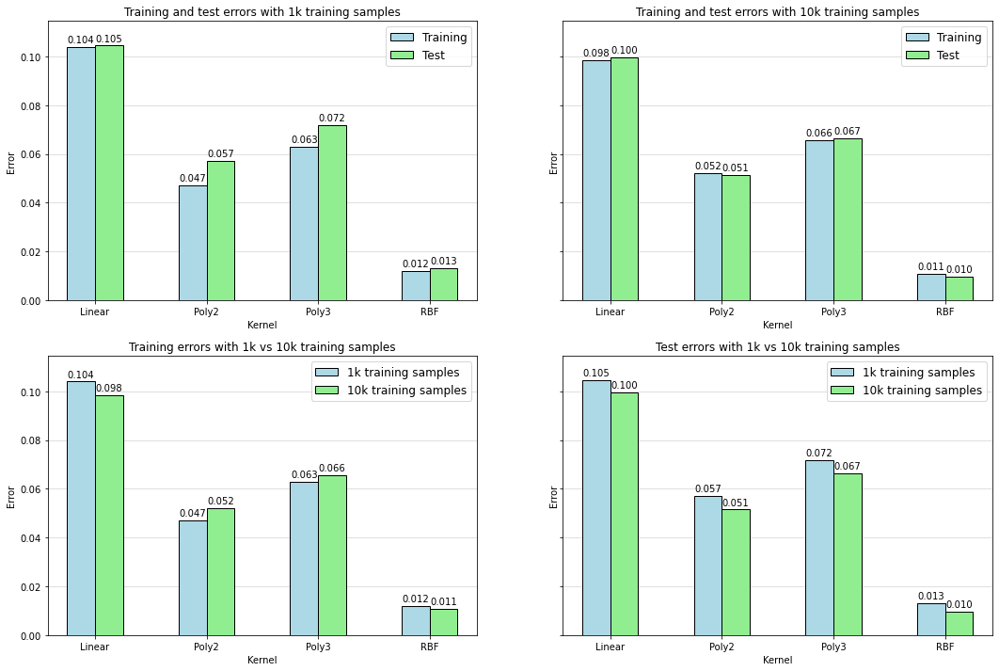

In [31]:
fig = plt.figure(figsize=(18, 12))
ax = fig.subplots(nrows=2, ncols=2, sharey=True)

ax[0][0] = comparison_barplot(fig, training_errors, test_errors, title="Training and test errors with 1k training samples", labels=["Training", "Test"], ax=ax[0][0])
ax[0][1] = comparison_barplot(fig, training_errors_1, test_errors_1, title="Training and test errors with 10k training samples", labels=["Training", "Test"], ax=ax[0][1])
ax[1][0] = comparison_barplot(fig, training_errors, training_errors_1, title="Training errors with 1k vs 10k training samples", labels=["1k training samples", "10k training samples"], ax=ax[1][0])
ax[1][1] = comparison_barplot(fig, test_errors, test_errors_1, title="Test errors with 1k vs 10k training samples", labels=["1k training samples", "10k training samples"], ax=ax[1][1])

plt.show()


<div class="alert alert-block alert-warning">
Starting from the top row, on the left we have the training and test error for each kernel when training the classifier on 1000 samples (that is, the one we have already seen above!). On the right we have the training and test error for each kernel when training the classifier on 10000 samples. We see that using a larger training set makes the training and test errors much more similar, reducing the dependence of the classifier on the particular training set. <br>

In the bottom row, instead, we find the direct comparison between the two configurations (i.e. 1000 training samples in blue vs 10000 training samples in green). <br>

On the left we compare the training error. Given that the approximation error is greater than zero, we expect the training error to increase with the sample size as it becomes harder to give an explanation to all the samples. What we observe is that the training error increases for the polynomial kernels and instead decreases for the linear and RBF kernel. Though, all these variations are very small, and we could potentially say that the training error remains the same. <br>

On the right we compare the test error. Given that the approximation error is greater than zero, we expect the test error to decrease when increasing the training set size. It is clear that the test error decreases for all the kernels, though not much. <br>

Overall, we could say that the behavior of the classifier is under control! However, notice that increasing the training set size does not really affect that much the performance of the classifiers.

</div>

**TO DO (B.2):** Just for comparison, let's also use logistic regression (without regularization, i.e. with C very large).

In [32]:
from sklearn import linear_model

# logistic regression
logreg = linear_model.LogisticRegression(C=1e5)
logreg.fit(X_train, y_train)
training_error_lr = 1 - logreg.score(X_train, y_train)
test_error_lr = 1 - logreg.score(X_test, y_test)

print ("Logistic regression training error: %f" % training_error_lr)
print ("Logistic regression test error: %f" % test_error_lr)

Logistic regression training error: 0.110100
Logistic regression test error: 0.111250


**TO DO (B.3):** Try logistic regression with regularization (use C=1)

In [33]:
logregL2 = linear_model.LogisticRegression(C=1)
logregL2.fit(X_train, y_train)
training_error_lr2 = 1 - logregL2.score(X_train, y_train)
test_error_lr2 = 1 - logregL2.score(X_test, y_test)

print ("Regularized logistic regression training error: %f" % training_error_lr2)
print ("Regularized logistic regression test error: %f" % test_error_lr2)

Regularized logistic regression training error: 0.108900
Regularized logistic regression test error: 0.109000


In [34]:
# add the logistic regression errors to the previous errors
training_errors_2 = [training_error_lr, training_error_lr2] + training_errors_1 
test_errors_2     = [test_error_lr, test_error_lr2]         + test_errors_1     

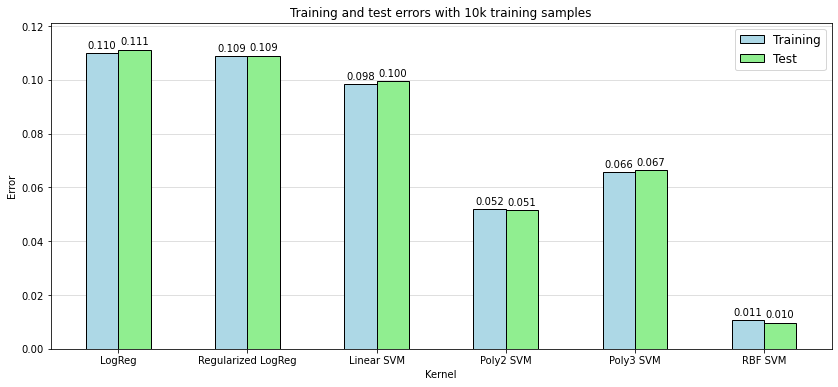

In [35]:
fig = plt.figure(figsize=(14, 6))

ax = comparison_barplot(fig, training_errors_2, test_errors_2, title="Training and test errors with 10k training samples", labels=["Training", "Test"], names=["LogReg", "Regularized LogReg", "Linear SVM", "Poly2 SVM", "Poly3 SVM", "RBF SVM"])

plt.show()

<div class="alert alert-block alert-warning">
From the plot above we can see that the logistic regression classifier performs worse than any of the SVM classifiers. Intuitively, that is because of the absence of the feature map. A few cells below I show the decision boundaries of the logistic regression classifier. 
</div>

# C) Boundaries Visualization

Now let us compare the shape of classification boundaries. 


**TO DO (C.0):** Use the SVM, logistic regression (with and without regularization) to predict on the test set X_test. 

In [36]:
rbf_SVM_test = best_SVM.predict(X_test)
lr_test      = logreg.predict(X_test)
regL2_test   = logregL2.predict(X_test)


We constructed a grid of all possible combinations of input values, we now use it to extract the classification boundaries of the three classifiers by having them predict on each input.

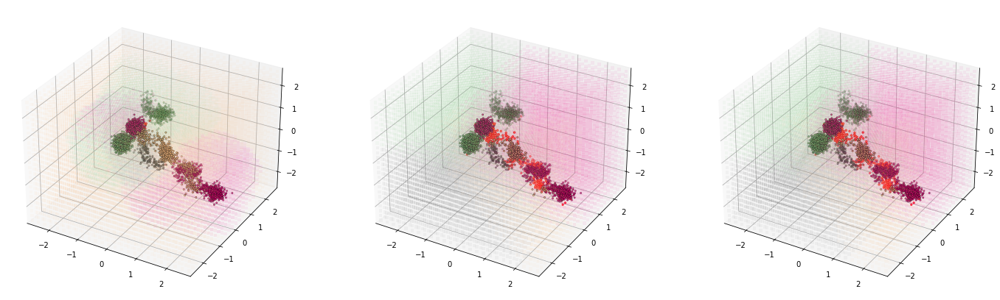

In [37]:

rbf_SVM_grid = best_SVM.predict(x_grid)
lr_grid      = logreg.predict(x_grid)
regL2_grid   = logregL2.predict(x_grid)


rbf_SVM_m = y_test == rbf_SVM_test
lr_m      = y_test == lr_test
regL2_m   = y_test == lr_test

fig = plt.figure(figsize=(24,40))
ax1 = fig.add_subplot(1, 3, 1, projection="3d")
ax2 = fig.add_subplot(1, 3, 2, projection="3d")
ax3 = fig.add_subplot(1, 3, 3, projection="3d")

ax1.scatter(x_grid[:,0], x_grid[:,1], x_grid[:,2], c=rbf_SVM_grid, linewidth=0, marker="s", alpha=.05,cmap='Accent')
ax2.scatter(x_grid[:,0], x_grid[:,1], x_grid[:,2], c=lr_grid, linewidth=0, marker="s", alpha=.05,cmap='Accent')
ax3.scatter(x_grid[:,0], x_grid[:,1], x_grid[:,2], c=regL2_grid, linewidth=0, marker="s", alpha=.05,cmap='Accent')

ax1.scatter(X_test[rbf_SVM_m,0], X_test[rbf_SVM_m,1], X_test[rbf_SVM_m,2], c=y_test[rbf_SVM_m], linewidth=.5, edgecolor="k", marker=".",cmap='Accent')
ax1.scatter(X_test[~rbf_SVM_m,0], X_test[~rbf_SVM_m,1], X_test[~rbf_SVM_m,2], c=y_test[~rbf_SVM_m], linewidth=1, edgecolor="r", marker=".",cmap='Accent')
ax1.set_xlim([-x_max, x_max])
ax1.set_ylim([-x_max, x_max])
ax1.set_zlim([-x_max, x_max])

ax2.scatter(X_test[lr_m,0], X_test[lr_m,1], X_test[lr_m,2], c=y_test[lr_m], linewidth=.5, edgecolor="k", marker=".",cmap='Accent')
ax2.scatter(X_test[~lr_m,0], X_test[~lr_m,1], X_test[~lr_m,2], c=y_test[~lr_m], linewidth=1, edgecolor="r", marker=".",cmap='Accent')
ax2.set_xlim([-x_max, x_max])
ax2.set_ylim([-x_max, x_max])
ax2.set_zlim([-x_max, x_max])

ax3.scatter(X_test[regL2_m,0], X_test[regL2_m,1], X_test[regL2_m,2], c=y_test[regL2_m], linewidth=.5, edgecolor="k", marker=".",cmap='Accent')
ax3.scatter(X_test[~regL2_m,0], X_test[~regL2_m,1], X_test[~regL2_m,2], c=y_test[~regL2_m], linewidth=1, edgecolor="r", marker=".",cmap='Accent')
ax3.set_xlim([-x_max, x_max])
ax3.set_ylim([-x_max, x_max])
ax3.set_zlim([-x_max, x_max])

plt.show()

In [38]:
plot_interactive(X_test, y_test, logreg, opacity=0.01, title="Logistic regression boundary visualization")

In [39]:
plot_interactive(X_test, y_test, logregL2, opacity=0.01, title="Regularized logistic regression boundary visualization")

**TO DO (C.Q1) [Answer the following]** <br> 
Compare and discuss:
- the results from SVM with m=600 and with m=10000 (or whatever value you set) training data points. If you stopped the SVM, include such aspect in your comparison.
- the results of SVM and of Logistic Regression

<div class="alert alert-block alert-info">
<strong>ANSWER C.Q1</strong>:<br>

Since I have basically commented on these points in the previous cells (see yellow text boxes), I will just summarize what we have seen. <br>
<br>
<strong>
    Comparison between 1k-training-samples and 10k-training-samples results using SVM with different kernels
</strong>
<br>
    
As we have seen in the comparison barplots above, using a larger training set makes the training and test errors much more similar, reducing the dependence of the classifier on the particular training set. This indeed makes sense as using a ten times larger training set allows the classifier to be much more robust. Instead, with fewer samples, the training set could be dominated by the stochasticity of the random selection of samples out of the whole dataset and could potentially be non-representative of the true underlying data distribution (hence leading to a typically larger test error!).
    
Given that the approximation error is greater than zero, we observe the expected scaling behavior of the classifier w.r.t. the training set size. That is, we see that the training error increases while the test error decreases. Though, these increase/decrease is small.
<br>
<br>
<strong>
    Comparison between SVMs and LogisticRegression results
</strong>
<br>
We have seen that the logistic regression classifier performs worse than any of the SVM classifiers, intuitively because of the absence of the feature map. Though, we could say that SVM with linear kernel and LogisticRegression are comparable.
    
</div>

**TO DO (C.1):** Change the code below to highlight the samples classified correctly by SVM and wrongly by logistic regression.

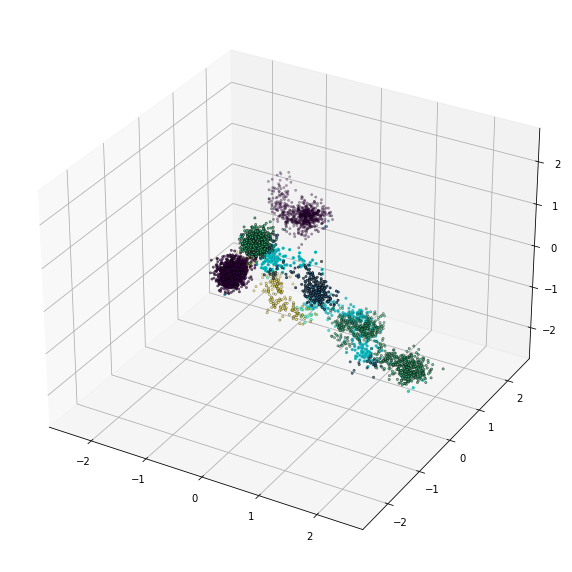

In [40]:
fig = plt.figure(figsize=(10,18))
ax = fig.add_subplot(projection="3d")

# mask that highlights the test points that were classified corerctly by SVM and incorrectly by logistic regression
mask = (rbf_SVM_m) & (~lr_m)

ax.scatter(X_test[mask,0], X_test[mask,1], X_test[mask,2], c=y_test[mask], linewidth=1, edgecolor="c", marker=".")
ax.scatter(X_test[~mask,0], X_test[~mask,1], X_test[~mask,2], c=y_test[~mask], linewidth=.5, edgecolor="k", marker=".")
ax.set_xlim([-x_max, x_max])
ax.set_ylim([-x_max, x_max])
ax.set_zlim([-x_max, x_max])

plt.show()

**TO DO (C.2):** Plot the confusion matrix for the SVM classifier and for logistic regression. The confusion matrix has one column for each predicted label and one row for each true label. 
It shows for each class in the corresponding row how many samples belonging to that class gets each possible output label. Notice that the diagonal contains the correctly classified samples, while the other cells correspond to errors. You can obtain it with the sklearn.metrics.confusion_matrix function (see the documentation). You can also print also the normalized confusion matrix.


In [41]:
from sklearn.metrics import confusion_matrix


np.set_printoptions(precision=2, suppress=True) # for better aligned printing of confusion matrix use floatmode='fixed'

u, counts = np.unique(y_test, return_counts=True)
print("Labels and frequencies in test set: ", counts)

confusion_SVM = confusion_matrix(y_test, rbf_SVM_test)
print("\n Confusion matrix SVM  \n \n", confusion_SVM)
print("\n Confusion matrix SVM (normalized)   \n \n", confusion_SVM /counts[:,None] )

confusion_LR =  confusion_matrix(y_test, lr_test)
print("\n Confusion matrix LR  \n \n", confusion_LR)
print("\n Confusion matrix LR (normalized)   \n \n", confusion_LR /counts[:,None] )

Labels and frequencies in test set:  [1621  687 1450  242]

 Confusion matrix SVM  
 
 [[1621    0    0    0]
 [   0  661   26    0]
 [   0   12 1438    0]
 [   0    1    0  241]]

 Confusion matrix SVM (normalized)   
 
 [[1.   0.   0.   0.  ]
 [0.   0.96 0.04 0.  ]
 [0.   0.01 0.99 0.  ]
 [0.   0.   0.   1.  ]]

 Confusion matrix LR  
 
 [[1618    0    2    1]
 [   0  275  384   28]
 [   1    5 1440    4]
 [   3    0   17  222]]

 Confusion matrix LR (normalized)   
 
 [[1.   0.   0.   0.  ]
 [0.   0.4  0.56 0.04]
 [0.   0.   0.99 0.  ]
 [0.01 0.   0.07 0.92]]


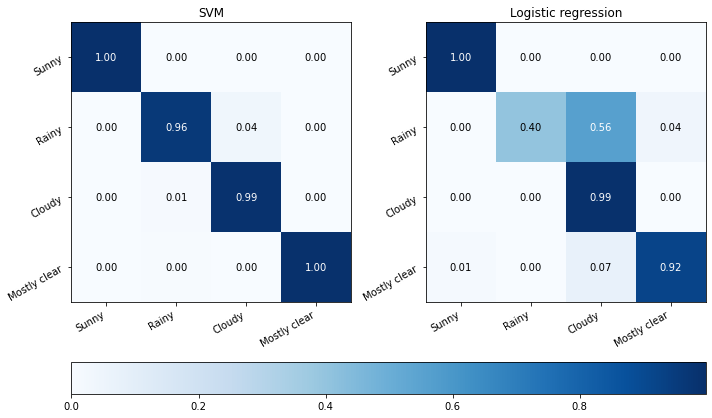

In [42]:
fig, axs = plt.subplots(1, 2, figsize=(10, 6))

for idx, conf in enumerate([confusion_SVM, confusion_LR]):
    
    im = axs[idx].imshow(conf /counts[:,None], cmap="Blues",interpolation='nearest')
    axs[idx].set_xticks([0,1,2,3])
    axs[idx].set_yticks([0,1,2,3])
    axs[idx].set_xticklabels(['Sunny', 'Rainy','Cloudy', 'Mostly clear'],ha="right",rotation=30) 
    axs[idx].set_yticklabels(['Sunny', 'Rainy','Cloudy', 'Mostly clear'],ha="right",rotation=30) 
    cm = conf /counts[:,None]
    fmt = '.2f'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            axs[idx].text(j, i, format(cm[i, j], fmt),
            ha="center", va="center",
            color="white" if cm[i, j] > thresh else "black")

axs[0].set_title("SVM")
axs[1].set_title("Logistic regression")
fig.tight_layout()
fig.colorbar(im, ax=axs[:], location='bottom')  
plt.show()

**TO DO (C.Q2) [Answer the following]** <br> 
Have a look at the confusion matrices and comment on the obtained accuracies. Why some classes have lower accuracies and others an higher one ? Make some guesses on the possible causes.


<div class="alert alert-block alert-info">
<strong>ANSWER C.Q2</strong>:<br>

First of all, as stated in the text above, rows correspond to true labels while columns to predicted labels. Hence, we see at a glance that the critical class is the "Rainy" class that is typically confused with the "Cloudy" class. That happens for both the SVM with RBF kernel and the LogReg, though the SVM misclassifies only the 4% of "Rainy" points while LogReg misclassifies more than 50% of "Rainy" points. 
    
Samples belonging to the "Rainy" class are indeed the hardest to classify due to the distribution of the classes in the 3-dimensional space. In the cell below this one I re-propose the plot of the dataset to make my point clearer (and I suggest to turn off the "Sunny" and "Mostly Clear" classes by clicking at their names in the legend to better focus on the "Rainy" and "Cloudy" classes).
    
The problem of these two classes is that they are both distributed as two blobs. Blobs of the same class are quite far apart while blobs of different classes are arranged in pairs. Meaning, "Rainy" and "Cloudy" blobs are really close to each other in different regions of the space. The "Cloudy" blob at lower values of z-axis is crucial: it has a "Rainy" blob right above it in the direction of the other "Cloudy" blob. It is clear then that linear boundaries (such as the ones given by Logreg), to classify "Cloudy" samples, need to cross a portion of the "Rainy" blob in the way between the two "Cloudy" blobs. This can be easily seen using the interactive plots showing the misclassified samples: the most frequent and abundant misclassified points are "Rainy" points classified as "Cloudy" in the in-between blob!
    
The other classes instead are well constrained in a specific region and even linear models are enough to correctly classify samples belonging to those classes. Note though that even if the "Sunny" class is divided into two blobs, these two blobs have no other point between them and therefore the task is as easy as if the points were distributed as a single, big blob.
</div>

In [43]:
colors=("#7fc97f","#fdc086", "#f0027f", "#666666")

fig = go.Figure()

fig.add_trace(go.Scatter3d(x=X_train[y_train==0][:, 0], y=X_train[y_train==0][:, 1], z=X_train[y_train==0][:, 2], mode='markers', marker=dict(size=5, color=colors[0]), name="Sunny"))
fig.add_trace(go.Scatter3d(x=X_train[y_train==1][:, 0], y=X_train[y_train==1][:, 1], z=X_train[y_train==1][:, 2], mode='markers', marker=dict(size=5, color=colors[1]), name="Rainy"))
fig.add_trace(go.Scatter3d(x=X_train[y_train==2][:, 0], y=X_train[y_train==2][:, 1], z=X_train[y_train==2][:, 2], mode='markers', marker=dict(size=5, color=colors[2]), name="Cloudy"))
fig.add_trace(go.Scatter3d(x=X_train[y_train==3][:, 0], y=X_train[y_train==3][:, 1], z=X_train[y_train==3][:, 2], mode='markers', marker=dict(size=5, color=colors[3]), name="Mostly Clear"))
    
fig.update_layout(width=800, height=600,legend=dict(font=dict(size=16)))
fig.update_layout(scene=dict(xaxis=dict(range=[-x_max, x_max]), yaxis=dict(range=[-x_max, x_max]), zaxis=dict(range=[-x_max, x_max])))
fig.show()